In [1]:
!git clone https://github.com/sskyisthelimit/DS_Internship.git

Cloning into 'DS_Internship'...
remote: Enumerating objects: 167, done.
remote: Counting objects: 100% (167/167), done.
remote: Compressing objects: 100% (110/110), done.
remote: Total 167 (delta 62), reused 151 (delta 46), pack-reused 0 (from 0)
Receiving objects: 100% (167/167), 6.40 MiB | 24.91 MiB/s, done.
Resolving deltas: 100% (62/62), done.


In [2]:
cd DS_Internship/CV/

/kaggle/working/DS_Internship/CV


In [ ]:
!pip install -r requirements.txt

In [4]:
cd ../../

/kaggle/working


In [5]:
!git clone --quiet https://github.com/cvg/LightGlue/
%cd LightGlue
!pip install --progress-bar off --quiet -e .

/kaggle/working/LightGlue


In [6]:
filepath1 = "/kaggle/input/satellite-test-set/S2A_MSIL2A_20191206T085341_N0213_R107_T36UXA_20191206T102420/T36UXA_20191206T085341_TCI_10m.jp2"
filepath2 = "/kaggle/input/satellite-test-set/S2B_MSIL2A_20200320T084639_N0214_R107_T36UXA_20200320T112112/T36UXA_20200320T084639_TCI_10m.jp2"

In [7]:
from rasterio.plot import reshape_as_image
from PIL import Image
import rasterio
import os
filepath1_png = "/kaggle/working/satellite-test-set/S2A_MSIL2A_20191206T085341_N0213_R107_T36UXA_20191206T102420/T36UXA_20191206T085341_TCI_10m.png"
filepath2_png = "/kaggle/working/satellite-test-set/S2B_MSIL2A_20200320T084639_N0214_R107_T36UXA_20200320T112112/T36UXA_20200320T084639_TCI_10m.png"

def reduce_and_to_png(jp2_file_path, png_file_path):
  with rasterio.open(jp2_file_path) as src:
      data = src.read()
      profile = src.profile

  image_array = reshape_as_image(data)

  image = Image.fromarray(image_array)
  os.makedirs(os.path.dirname(png_file_path), exist_ok=True)  
  image.save(png_file_path, format='PNG', quality=90)

reduce_and_to_png(filepath1, filepath1_png)
reduce_and_to_png(filepath2, filepath2_png)

In [8]:
from lightglue import LightGlue, SuperPoint, DISK
from lightglue.utils import load_image, rbd
from lightglue import viz2d
import torch

device = "cuda:0"

extractor_model = SuperPoint(max_num_keypoints=500).eval().to(device)
matcher_model = LightGlue(features="superpoint").eval().to(device)

/kaggle/working/LightGlue/lightglue/lightglue.py:24: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  @torch.cuda.amp.custom_fwd(cast_inputs=torch.float32)
Downloading: "https://github.com/cvg/LightGlue/releases/download/v0.1_arxiv/superpoint_v1.pth" to /root/.cache/torch/hub/checkpoints/superpoint_v1.pth
100%|██████████| 4.96M/4.96M [00:00<00:00, 103MB/s]
Downloading: "https://github.com/cvg/LightGlue/releases/download/v0.1_arxiv/superpoint_lightglue.pth" to /root/.cache/torch/hub/checkpoints/superpoint_lightglue_v0-1_arxiv.pth
100%|██████████| 45.3M/45.3M [00:00<00:00, 323MB/s]


In [9]:
cd ../DS_Internship/CV/src

/kaggle/working/DS_Internship/CV/src


/kaggle/working/DS_Internship/CV/src/inference_utils.py:174: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at /usr/local/src/pytorch/aten/src/ATen/native/TensorShape.cpp:3697.)
  axes[0].imshow(crp1.squeeze(0).T.cpu(), cmap="gray")


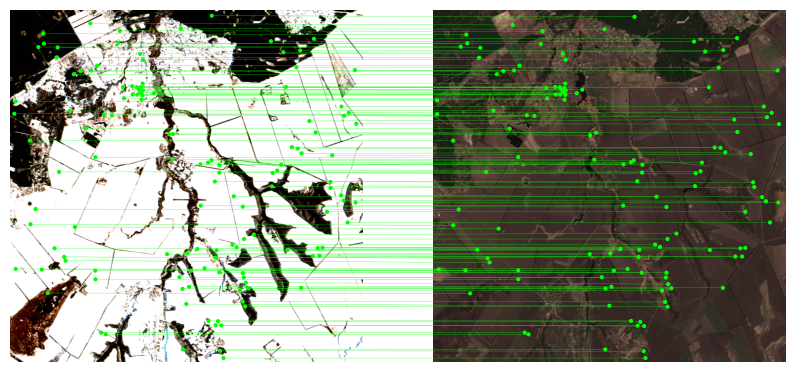

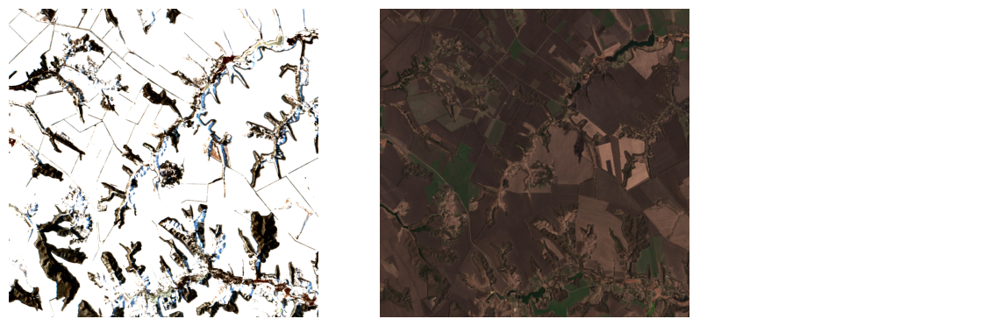

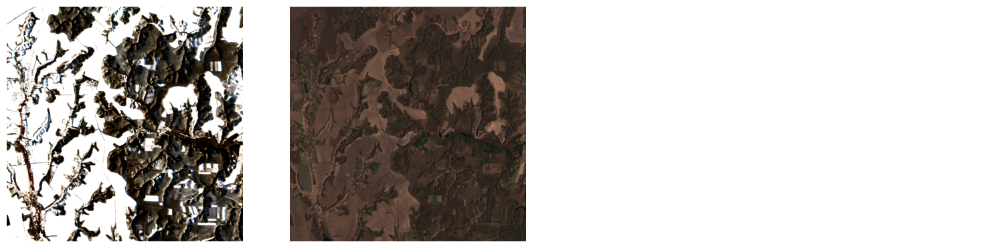

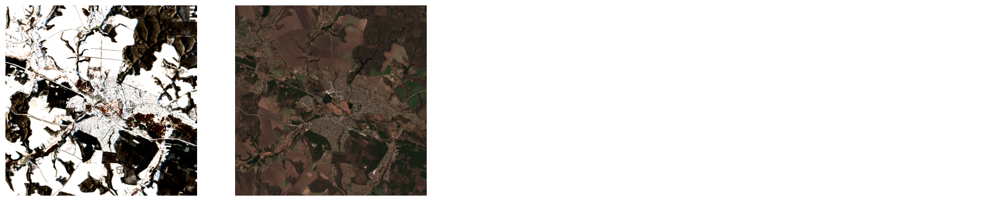

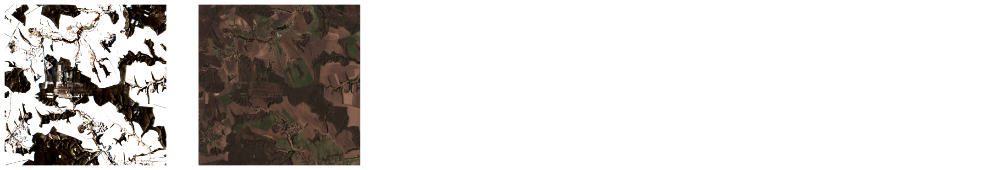

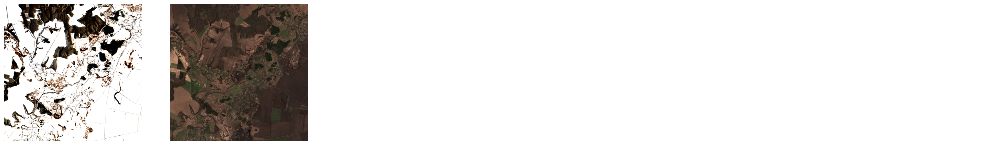

In [11]:
from inference_utils import lightglue_matcher, loftr_matcher

lightglue_matcher(
      path_img_1=filepath1_png,
      path_img_2=filepath2_png,
      matcher=matcher_model,
      extractor=extractor_model,
      w=10980,
      h=10980,
      n_pair=20,
      crp_w=1098,
      crp_h=1098,
      device=device,
      limit_printing=6)

In [14]:
import kornia.feature as KF
device = "cuda:1"
matcher_model = KF.LoFTR(pretrained='outdoor').to(device)

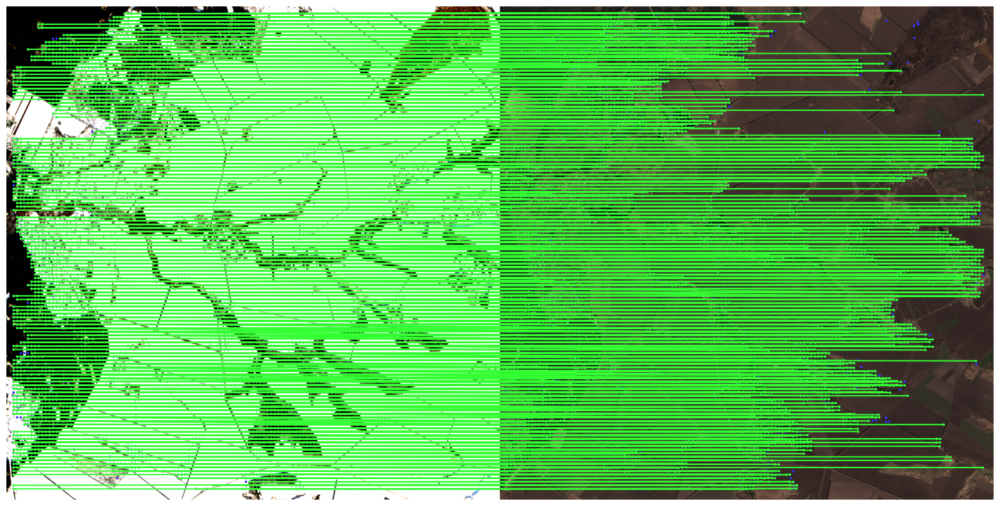

<Figure size 640x480 with 0 Axes>

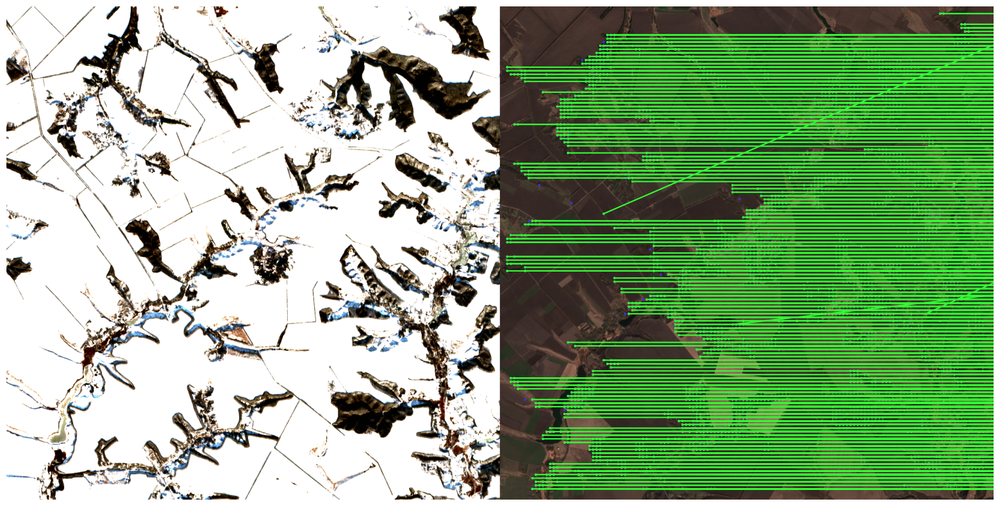

<Figure size 640x480 with 0 Axes>

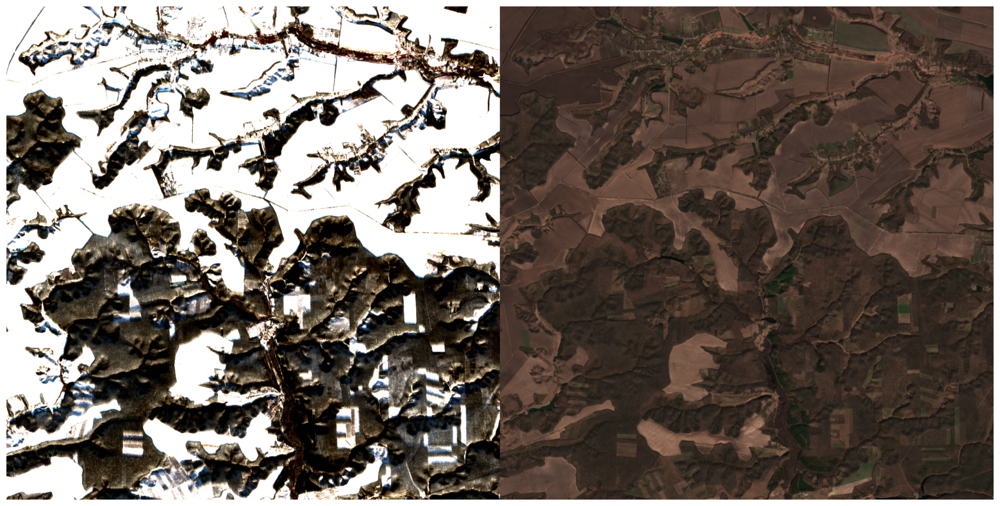

<Figure size 640x480 with 0 Axes>

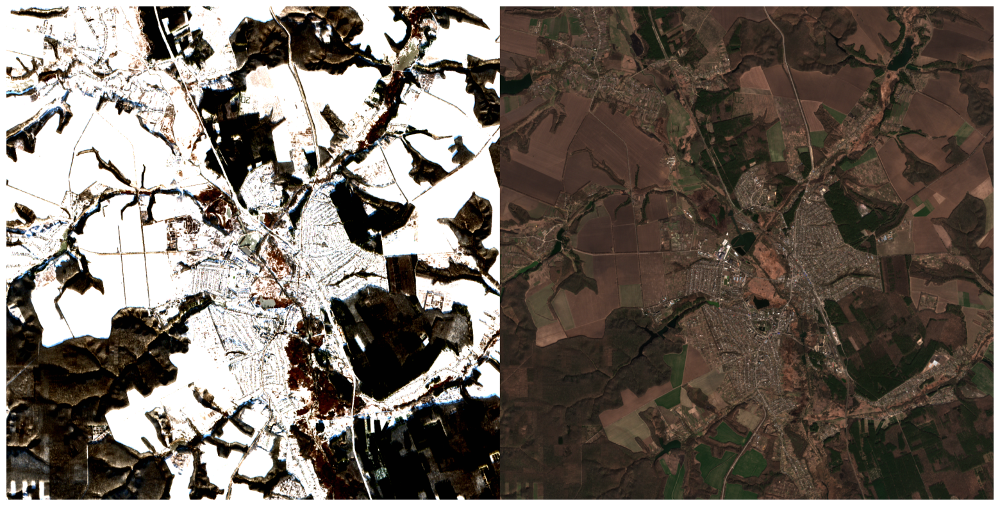

<Figure size 640x480 with 0 Axes>

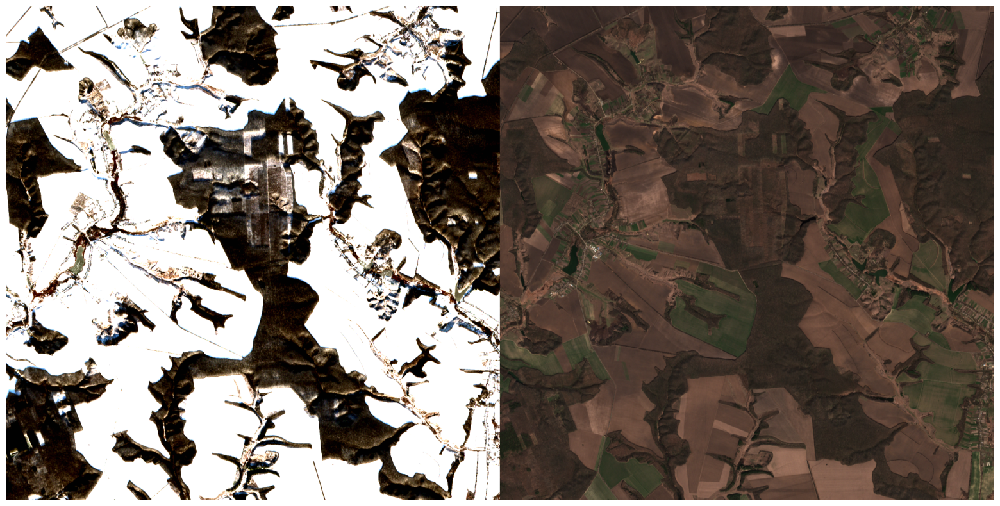

<Figure size 640x480 with 0 Axes>

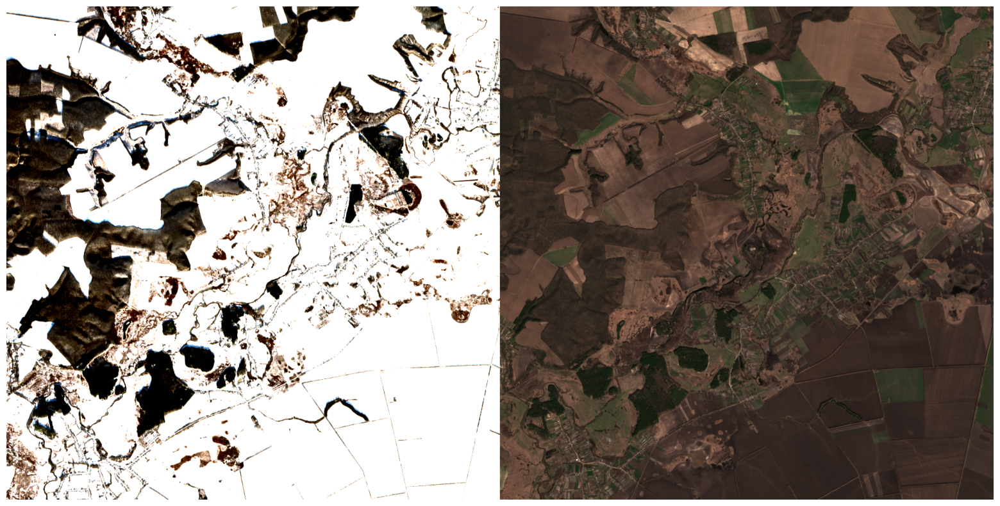

<Figure size 640x480 with 0 Axes>

In [15]:
loftr_matcher(
      path_img_1=filepath1_png,
      path_img_2=filepath2_png,
      matcher=matcher_model,
      w=10980,
      h=10980,
      n_pair=20,
      crp_w=1098,
      crp_h=1098,
      device=device,
      limit_printing=6)